# Long-Short Equity Strategy using Ranking


Long-short equity strategy is both long and short stocks simulatenously in the market. The strategy rank all stocks in the market using some model and goes long (buys) the top $n$ equities of the ranking, and short on (sells) the bottom $n$ for equal amounts of money(Total value of long position = Total value of short position). 

This is statistically robust - by ranking stocks and entering multiple positions, you are making many bets on your ranking model rather than just a few risky bets. You are also betting purely on the quality of your ranking scheme, as the equal dollar volume long and short positions ensure that the strategy will remain market neutral (immune to market movements).

## Ranking Scheme

A ranking scheme is any model that can assign each stocks a number, where higher is better or worse. Examples could be value factors, technical indicators, pricing models, or a combination of all of the above. For example, you could use a momentum indicator to give a ranking to stocks, or combine two indicators like Score = (0.5 x the PE Ratio of that stock) + (0.5 x the 30 day price momentum)

The success of this strategy lies in the ranking scheme used - the returns of a long-short equity strategy are dependent on how well the ranking spreads out the high and low returns, so developing a ranking scheme is nontrivial.

## Making a Bet on the Ranking Scheme

Once we have determined a ranking scheme, we would like to be able to profit from it. We do this by investing an equal amount of money long into the top of the ranking, and short into the bottom. This ensures that the strategy will make money proportionally to the quality of the ranking only, and will be market neutral.

Let's say you are ranking $m$ equities, have $d$ dollars to invest, and your total target number of positions to hold is $2n$

* For each equity in spots $1, \dots, n$ in the ranking, sell $\frac{1}{2n} * d$ dollars of that equity
* For each equity in spots $m - n, \dots, m$ in the ranking, buy $\frac{1}{2n} * d$ dollars of that equity. 

**Note: Friction Because of Prices**
Because equity prices will not always divide $\frac{1}{2n} * d$ evenly, and equities must be bought in integer amounts, there will be some imprecision and the algorithm should get as close as it can to this number. Most algorithms will have access to some leverage during execution, so it is fine to buy slightly more than $\frac{1}{2n} * d$ dollars per equity. This does, however, cause some friction at low capital amounts. For a strategy running $d = 100000$, and $n = 500$, we see that 
$$\frac{1}{2n} * d = \frac{1}{1000} * 100000 = 100$$
This will cause big problems for expensive equities, and cause the algorithm to be overlevered. This is alleviated by trading fewer equities or increasing the capital, $d$.

### Let's run through a hypothetical example
We generate random equite names and a random factor on which to rank them. We also assume our future returns are dependent on these factor values.

In [1]:
import numpy as np
import statsmodels.api as sm
import scipy.stats as stats
import scipy.spatial.distance as distance
import scipy
from statsmodels import regression
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [2]:
## PROBLEM SETUP ##

# Generate Equities and a random factor value for them

equity_names = ['Equity ' + str(x) for x in range(10000)]
current_factor_values = np.random.normal(0, 1, 10000)

# Generate future returns for these are dependent on our factor values
future_returns = current_factor_values + np.random.normal(0, 1, 10000)

# Put both the factor values and returns into one dataframe
data = pd.DataFrame(index = equity_names, columns=['Factor Value','Returns'])
data['Factor Value'] = current_factor_values
data['Returns'] = future_returns
# Take a look
data.head(10)

,Factor Value,Returns
Equity 0,0.525205,-0.677312
Equity 1,0.837011,-0.823253
Equity 2,-1.218561,-0.751743
Equity 3,0.437263,-0.870905
Equity 4,0.754509,-1.154361
Equity 5,-0.562019,-0.511669
Equity 6,1.300608,0.317597
Equity 7,-1.212941,-0.618848
Equity 8,-1.369062,-0.752509
Equity 9,0.847877,0.447578


Now that we have factor values and returns, we can see what would happen if we ranked our equities based on factor values, and then entered the long and short positions.

C:\Users\Chandini\Miniconda3\envs\auquan\lib\site-packages\ipykernel\__main__.py:2: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  from ipykernel import kernelapp as app


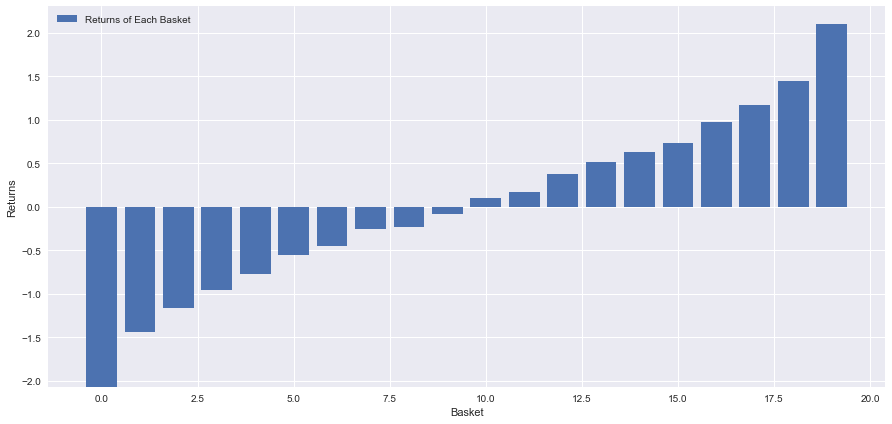

In [3]:
# Rank the equities
ranked_data = data.sort('Factor Value')

# Compute the returns of each basket with a basket size 500, so total (10000/500) baskets
number_of_baskets = int(10000/500)
basket_returns = np.zeros(number_of_baskets)

for i in range(number_of_baskets):
    start = i * 500
    end = i * 500 + 500 
    basket_returns[i] = ranked_data[start:end]['Returns'].mean()

# Plot the returns of each basket
plt.figure(figsize=(15,7))
plt.bar(range(number_of_baskets), basket_returns)
plt.ylabel('Returns')
plt.xlabel('Basket')
plt.legend(['Returns of Each Basket'])
plt.show()

Our strategy is to go long the top basket and short the bottom basket. The returns of this strategy are:

In [4]:
basket_returns[number_of_baskets-1] - basket_returns[0]

4.165266151197903

We're basically putting our money on our ranking model being able to separate and spread high performing stocks from low performing stocks. **The nice thing about making money based on the spread of the ranking is that it is unaffected by what the market does.**

## Let's now consider a real world example. 

We load data from all stocks of Nifty50 and try to rank them, we will use price based indicators for ranking. 


In [5]:
from backtester.trading_system_parameters import TradingSystemParameters
from datetime import timedelta
from backtester.dataSource.yahoo_data_source import YahooStockDataSource
from backtester.executionSystem.simple_execution_system import SimpleExecutionSystem
from backtester.orderPlacer.backtesting_order_placer import BacktestingOrderPlacer
from backtester.trading_system import TradingSystem
from backtester.constants import *
from backtester.logger import *
from my_custom_feature import MyCustomFeature
# Fetch prices data for 80 stocks from different sectors and plot prices
start = '2012/01/01'
end = '2016/12/31'
assets = ['NBR','GS','FCX','MET','JNPR','TGT','BSX','LLY','TXN','DIS','HD','DOW','GLW','TWX','HAL','X',
          'CAT','LOW','AMD','AMAT','CVS','BK','PEP','DD','LUV','WFC','AKS','SWN','EOG','USB','NEM',
          'CMCSA','VZ','T','EA','KR','PG','KO','WMT','DHI','MCD','BBY','PHM','M','GPS','AXP','COP']
          #'SPLS','FOXA','JCP','VLO','SLB','XOM','WMB','CHK',
          #'JPM','HST','HBAN','MS','KEY','RF','FITB','C','JNJ','AMGN','ABT','BMY','MRK','UNP',
          #'ARNC','NVDA','ADBE','SYMC','YHOO','EBAY','QCOM','HPQ',]
benchmark = 'SPY'
assets = list(set(assets + [benchmark]))
dataParser = YahooStockDataSource(cachedFolderName='yahooData',
                                     instrumentIds=assets,
                                     startDateStr=start,
                                     endDateStr=end)
price = 'adjClose'

We'll use a Moving Average Crossover Ribbon as a ranking indicator

In [ ]:
momDict = {'featureKey': 'mom_90',
           'featureId': 'momentum',
           'params': {'period': 90,
                      'featureName': 'adjClose'}}
featureDict = [momDict]
marketFeatureDict = []

In [ ]:
#This downloads the relevant files and calculates the features. Features are stored in files StockSymbol_Features.csv
class MyTradingParams(TradingSystemParameters):
    def getDataParser(self):
        return dataParser
    def getBenchmark(self):
        return benchmark
    def getInstrumentFeatureConfigDicts(self):
        return {INSTRUMENT_TYPE_STOCK: featureDict}
    def getMarketFeatureConfigDicts(self):
        return marketFeatureDict
    def getPriceFeatureKey(self):
        return price

tsParams = MyTradingParams()
tradingSystem = TradingSystem(tsParams)
tradingSystem.startTrading(onlyAnalyze=True, shouldPlot=False)

Info: Market Features: {'prediction': 0.0, 'portfolio_value': 1000000, 'pnl': 0, 'capital': 1000000}
Info: Update: 1, Time: 0.00, Average: 0.00
Info: Instrument Features: COP: {'high': 57.044147, 'capital': 0.0, 'fees': 0, 'volume': 10172600.0, 'adjClose': 45.55624, 'low': 56.350441, 'position': 0, 'close': 56.541019, 'open': 56.350441, 'mom_90': 0, 'pnl': 0}
Info: Instrument Features: AXP: {'high': 48.959999, 'capital': 0.0, 'fees': 0, 'volume': 6955400.0, 'adjClose': 44.554562, 'low': 48.139999, 'position': 0, 'close': 48.389999, 'open': 48.299999, 'mom_90': 0, 'pnl': 0}
Info: Instrument Features: NEM: {'high': 62.32, 'capital': 0.0, 'fees': 0, 'volume': 7418700.0, 'adjClose': 56.925014, 'low': 61.220001, 'position': 0, 'close': 62.080002, 'open': 61.41, 'mom_90': 0, 'pnl': 0}
Info: Instrument Features: EOG: {'high': 51.064999, 'capital': 0.0, 'fees': 0, 'volume': 5597400.0, 'adjClose': 48.799145, 'low': 50.200001, 'position': 0, 'close': 50.724998, 'open': 50.305, 'mom_90': 0, 'pnl'

In [11]:
#Read features into dataframe
from os import listdir
from os.path import isfile, join, basename

dir = tradingSystem.stateWriter.getFolderName()
all_data = {}
for fileName in listdir(dir):
    path = dir + '/' + fileName
    df = pd.read_csv(path, engine='python', index_col= 'time', parse_dates=True)
    all_data[fileName] = df
    print(fileName)


AKS_features.csv
AMAT_features.csv
AMD_features.csv
AXP_features.csv
BBY_features.csv
BK_features.csv
BSX_features.csv
CAT_features.csv
CMCSA_features.csv
COP_features.csv
CVS_features.csv
DD_features.csv
DHI_features.csv
DIS_features.csv
DOW_features.csv
EA_features.csv
EOG_features.csv
FCX_features.csv
GLW_features.csv
GPS_features.csv
GS_features.csv
HAL_features.csv
HD_features.csv
JNPR_features.csv
KO_features.csv
KR_features.csv
LLY_features.csv
LOW_features.csv
LUV_features.csv
marketFeatures.csv
MCD_features.csv
MET_features.csv
M_features.csv
NBR_features.csv
NEM_features.csv
PEP_features.csv
PG_features.csv
PHM_features.csv
SPY_features.csv
SWN_features.csv
TGT_features.csv
TWX_features.csv
TXN_features.csv
T_features.csv
USB_features.csv
VZ_features.csv
WFC_features.csv
WMT_features.csv
X_features.csv


In [152]:
#Let's load momentum score and returns into separate dataframes
index = df.index
mscores = pd.DataFrame(index=index,columns=assets)
prices = pd.DataFrame(index=index,columns=assets)
returns = pd.DataFrame(index=index,columns=assets)
day = 10
for symbol in assets:
    # mscores[symbol] = all_data[symbol+'_features.csv']['mom_90']
    prices[symbol] = all_data[symbol+'_features.csv'][price]
    mscores[symbol] = prices[symbol]/prices[symbol].shift(day) - 1

In [65]:
#Calculate Moving Average Crossover Ribbons for each
rolling_means = {}
for a in assets:
    rolling_means[a]= pd.DataFrame(columns=np.linspace(10, 100, 10))

for i in np.linspace(10, 100, 10):
    X = prices.rolling(window=int(i),center=False).mean()
    for a in assets:
        rolling_means[a][i] = X[a].dropna()
#Calculate a score for each security based on the ribbon
mscores = pd.DataFrame(index=rolling_means[a].index,columns=assets)
for a in assets:
    for date in rolling_means[a].index:
        mavg_values = rolling_means[a].loc[date]
        ranking = stats.rankdata(mavg_values.values)
        d = distance.hamming(ranking, range(1, 1+len(mavg_values)))
        mscores[a].loc[date] = d


## Analyzing data

* #### Correlation between score and returns

First, we need to look at correlation between our ranking score and forward returns, i.e. how predictive of of forward returns is our ranking factor? 

Here we look at daily correlation of scores with 1 month forward returns

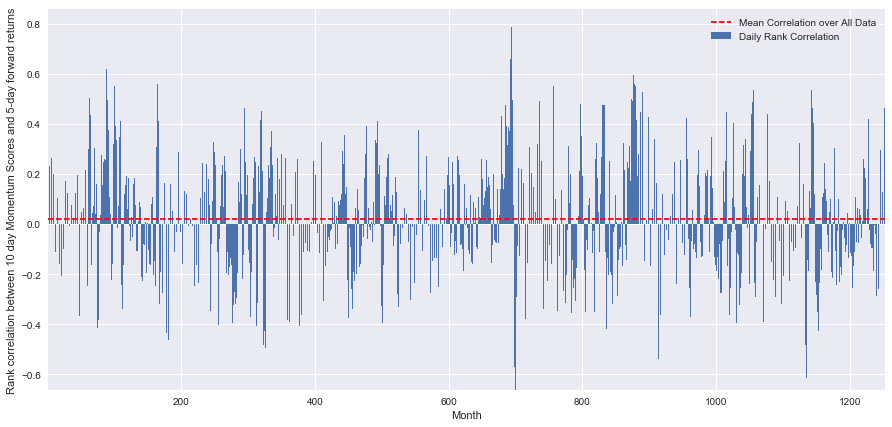

In [154]:
# Calculate Forward Monthly returns
forward_return_day = 5
returns = prices.shift(-forward_return_day)/prices -1
returns.dropna(inplace = True)
correl_scores = pd.DataFrame(index = returns.index.intersection(mscores.index), columns = ['Scores', 'pvalues'])
for i in correl_scores.index:
    score, pvalue = stats.spearmanr(mscores.loc[i], returns.loc[i])
    correl_scores['pvalues'].loc[i] = pvalue
    correl_scores['Scores'].loc[i] = score
correl_scores.dropna(inplace = True)    

l = correl_scores.index.size
plt.figure(figsize=(15,7))
plt.bar(range(1,1+l),correl_scores['Scores'])
plt.hlines(np.mean(correl_scores['Scores']), 1,l+1, colors='r', linestyles='dashed')
plt.xlabel('Month')
plt.xlim((1, l+1))
plt.legend(['Mean Correlation over All Data', 'Daily Rank Correlation'])
plt.ylabel('Rank correlation between %s day Momentum Scores and %s-day forward returns'%(day,forward_return_day));
plt.show()

Let's also look at averagemonthly correlation of scores with 1 month forward returns

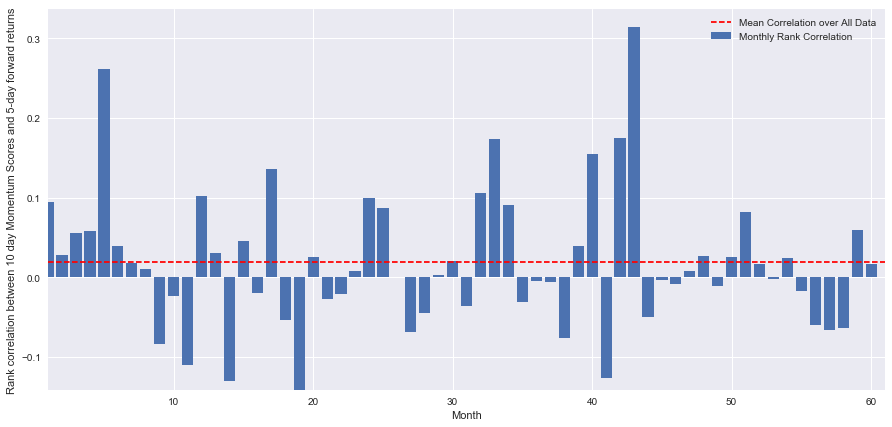

In [155]:
monthly_mean_correl =correl_scores['Scores'].astype(float).resample('M').mean()
plt.figure(figsize=(15,7))
plt.bar(range(1,len(monthly_mean_correl)+1), monthly_mean_correl)
plt.hlines(np.mean(monthly_mean_correl), 1,len(monthly_mean_correl)+1, colors='r', linestyles='dashed')
plt.xlabel('Month')
plt.xlim((1, len(monthly_mean_correl)+1))
plt.legend(['Mean Correlation over All Data', 'Monthly Rank Correlation'])
plt.ylabel('Rank correlation between %s day Momentum Scores and %s-day forward returns'%(day,forward_return_day));
plt.show()

We can see that the average correlation is positive, but varies a lot daily as well from month to month. 

* #### Average Basket Return

Now we compute the returns of baskets taken out of our ranking. If we rank all equities and then split them into $n$ groups, what would the mean return be of each group?  

The first step is to create a function that will give us the mean return in each basket in a given the month and a ranking factor.

In [145]:
def compute_basket_returns(factor, forward_returns, number_of_baskets, index):

    data = pd.concat([factor.loc[index],forward_returns.loc[index]], axis=1)
    # Rank the equities on the factor values
    data.columns = ['Factor Value', 'Forward Returns']
    data.sort('Factor Value', inplace=True)
    # How many equities per basket
    equities_per_basket = np.floor(len(data.index) / number_of_baskets)

    basket_returns = np.zeros(number_of_baskets)

    # Compute the returns of each basket
    for i in range(number_of_baskets):
        start = i * equities_per_basket
        if i == number_of_baskets - 1:
            # Handle having a few extra in the last basket when our number of equities doesn't divide well
            end = len(data.index) - 1
        else:
            end = i * equities_per_basket + equities_per_basket
        # Actually compute the mean returns for each basket
        #s = data.index.iloc[start]
        #e = data.index.iloc[end]
        basket_returns[i] = data.iloc[int(start):int(end)]['Forward Returns'].mean()
        
    return basket_returns


We the average return of each basket when equities are ranked based on this score. This should give us a sense of the relationship over a long timeframe.

C:\Users\Chandini\Miniconda3\envs\auquan\lib\site-packages\ipykernel\__main__.py:6: FutureWarning:

sort(columns=....) is deprecated, use sort_values(by=.....)



[ 0.00045948  0.00024296  0.00071936  0.0006589   0.00048169  0.00082151
  0.00081588  0.00135329]


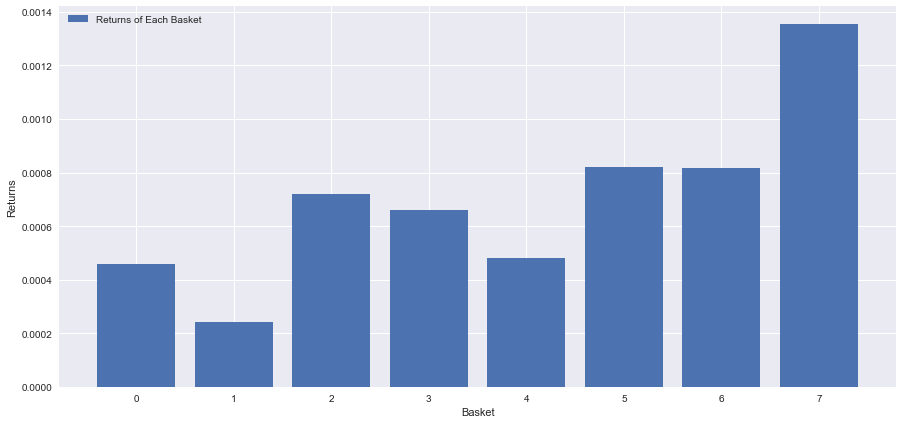

In [146]:
number_of_baskets = 8
mean_basket_returns = np.zeros(number_of_baskets)
forward_returns = prices.shift(-1)/prices -1
forward_returns.dropna(inplace = True)

for m in forward_returns.index.intersection(mscores.index):
    basket_returns = compute_basket_returns(mscores, forward_returns, number_of_baskets, m)
    mean_basket_returns += basket_returns

mean_basket_returns /= l    
print(mean_basket_returns)
# Plot the returns of each basket
plt.figure(figsize=(15,7))
plt.bar(range(number_of_baskets), mean_basket_returns)
plt.ylabel('Returns')
plt.xlabel('Basket')
plt.legend(['Returns of Each Basket'])
plt.show()

Seems like we are able to separate high performers from low performers with some success

* #### Spread Consistency

Of course, that's just the average relationship. To get a sense of how consistent this is, and whether or not we would want to trade on it, we should look at it over time. Here we'll look at the monthly spreads for the first two years. We can see a lot of variation, and further analysis should be done to determine whether this momentum score is tradeable.

C:\Users\Chandini\Miniconda3\envs\auquan\lib\site-packages\ipykernel\__main__.py:6: FutureWarning:

sort(columns=....) is deprecated, use sort_values(by=.....)



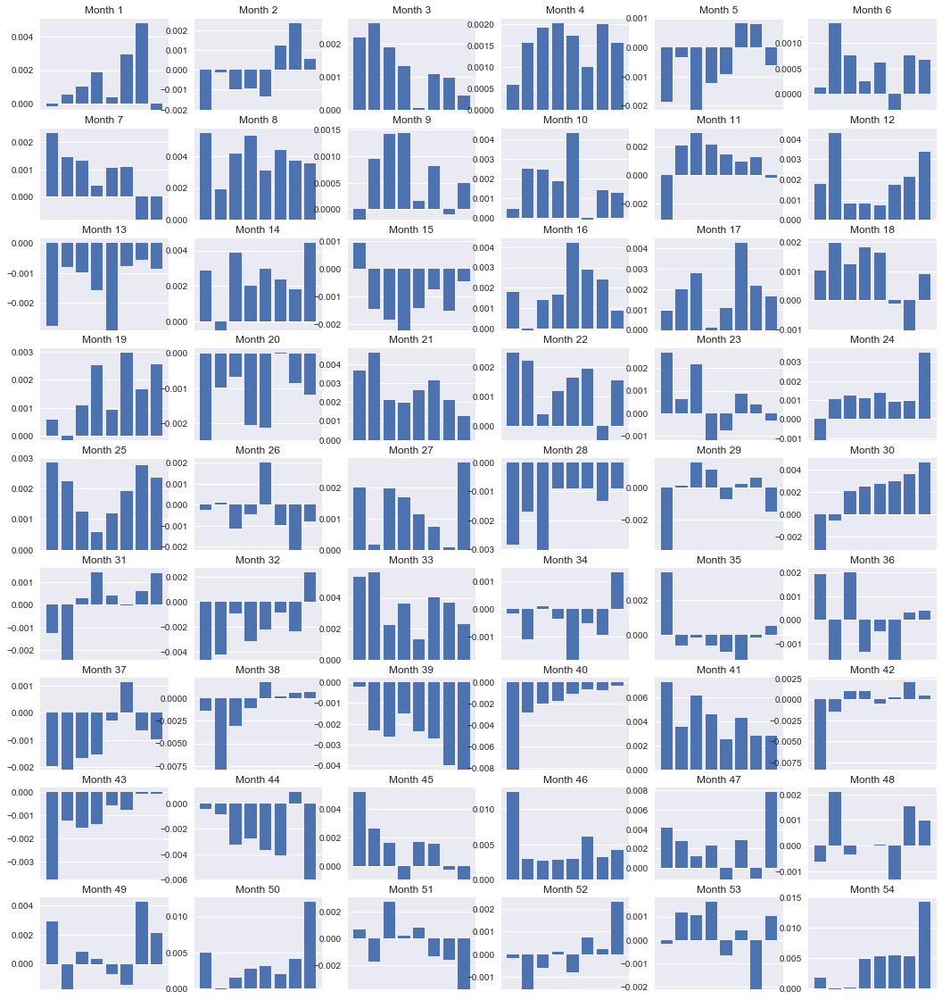

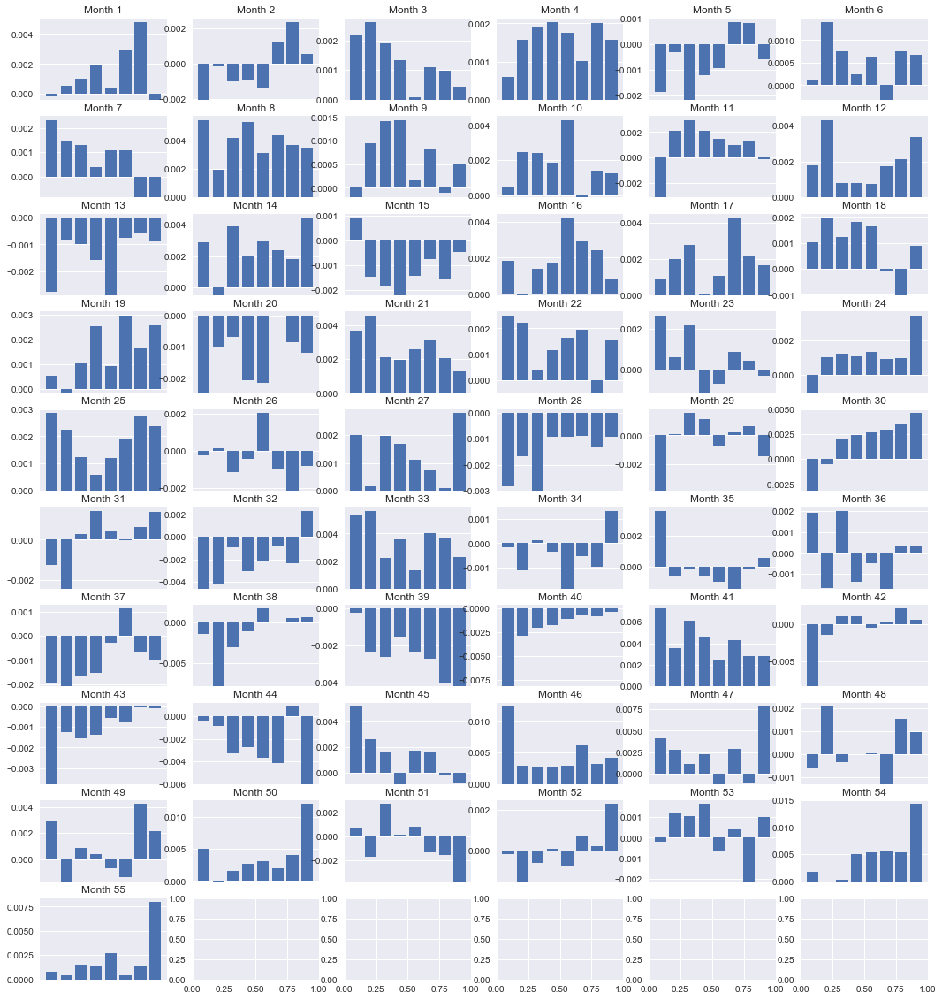

In [148]:
monthly_index = mscores.resample('M').last().index
mean_basket_returns = np.zeros(number_of_baskets)
strategy_returns = pd.Series(index = monthly_index)
f, axarr = plt.subplots(1+int(monthly_index.size/6), 6,figsize=(18, 20))
for month in range(1, monthly_index.size):
    temp_returns = forward_returns.loc[monthly_index[month-1]:monthly_index[month]]
    temp_scores = mscores.loc[monthly_index[month-1]:monthly_index[month]]
    for m in temp_returns.index.intersection(temp_scores.index):
        basket_returns = compute_basket_returns(temp_scores, temp_returns, number_of_baskets, m)
        mean_basket_returns += basket_returns
    
    strategy_returns[monthly_index[month-1]] = mean_basket_returns[ number_of_baskets-1] - mean_basket_returns[0]
    
    mean_basket_returns /= temp_returns.index.intersection(temp_scores.index).size
    
    r = int(np.floor((month-1) / 6))
    c = (month-1) % 6
    axarr[r, c].bar(range(number_of_baskets), mean_basket_returns)
    axarr[r, c].xaxis.set_visible(False) # Hide the axis lables so the plots aren't super messy
    axarr[r, c].set_title('Month ' + str(month))
plt.show()
        

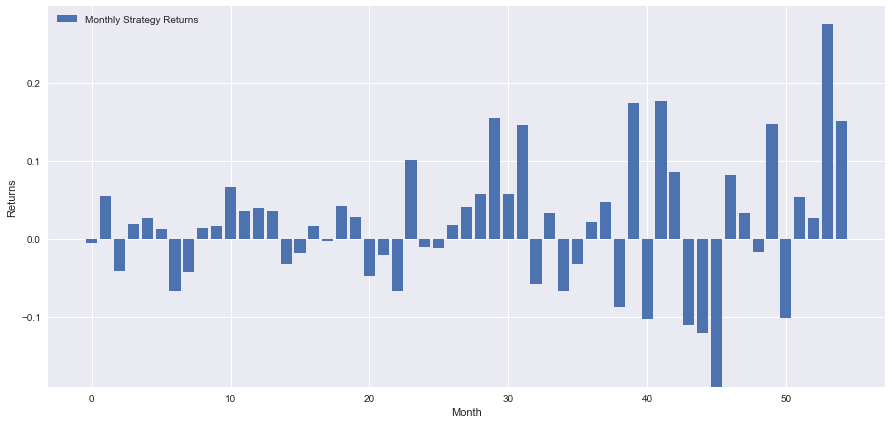

In [149]:
plt.figure(figsize=(15,7))
plt.bar(range(len(strategy_returns)), strategy_returns)
plt.ylabel('Returns')
plt.xlabel('Month')
plt.legend(['Monthly Strategy Returns'])
plt.show()

Finally, lets look at the returns if we had bought the last basket and sold the first basket every month (assuming equal capital allocation to each security)

In [151]:
total_return = strategy_returns.sum()
ann_return = 100*((1 + total_return)**(12.0 /float(strategy_returns.index.size))-1)
print('Annual Returns: %.2f%%'%ann_return)

Annual Returns: 16.37%


## Finding the correct ranking scheme

To execute a long-short equity, you effectively only have to determine the ranking scheme. Everything after that is mechanical. Once you have one long-short equity strategy, you can swap in different ranking schemes and leave everything else in place. It's a very convenient way to quickly iterate over ideas you have without having to worry about tweaking code every time.

The ranking schemes can come from pretty much any model as well. It doesn't have to be a value based factor model, it could be a machine learning technique that predicted returns one-month ahead and ranked based on that.


## Choice and Evaluation of a Ranking Scheme

The ranking scheme is where a long-short equity strategy gets its edge, and is the most crucial component. Choosing a good ranking scheme is the entire trick, and there is no easy answer. A good starting point is to pick existing known techniques, and see if you can modify them slightly to get increased returns. We'll discuss a few starting points here.

* ### Clone and Tweak
Choose one that is commonly discussed and see if you can modify it slightly to gain back an edge. Often times factors that are public will have no signal left as they have been completely arbitraged out of the market. However, sometimes they lead you in the right direction of where to go.

* ### Pricing Models
Any model that predicts future returns can be a factor. The future return predicted is now that factor, and can be used to rank your universe. You can take any complicated pricing model and transform it into a ranking.

* ### Price Based Factors (Technical Indicators)
Price based factors take information about the historical price of each equity and use it to generate the factor value. Examples could be 30-day momentum, or volatility measures.
#### Reversion vs. Momentum
It's important to note that some factors bet that prices, once moving in a direction, will continue to do so. Some factors bet the opposite. Both are valid models on different time horizons and assets, and it's important to investigate whether the underlying behavior is momentum or reversion based.

* ### Fundamental Factors (Value Based)
This is using combinations of fundamental values as we discussed today. Fundamental values contain information that is tied to real world facts about a company, so in many ways can be more robust than prices.

* ### The Arms Race
Ultimately, developing predictive factors is an arms race in which you are trying to stay one step ahead. Factors get arbitraged out of markets and have a lifespan, so it's important that you are constantly doing work to determine how much decay your factors are experiencing, and what new factors might be used to take their place.


## Additional Considerations

### Rebalancing Frequency

Every ranking system will be predictive of returns over a slightly different timeframe. A price-based mean reversion may be predictive over a few days, while a value-based factor model may be predictive over many months. It is important to determine the timeframe over which your model should be predictive, and statistically verify that before executing your strategy. You dont want to overfit by trying to optimize the relabancing frequency -  you will inevitably find one that is randomly better than others, but not necessary because of anything in your model.

Once you have determined the timeframe on which your ranking scheme is predictive, try to rebalance at about that frequency so you're taking full advantage of your models.


### Capital Capacity and Transaction Costs

Every strategy has a minimum and maximum amount of capital it can trade before it stops being profitable.


Trading many equities will result in high transaction costs. Say that you want to purchase $1000$ equities, you will incur thousands of dollars of costs per rebalance. Your capital base must be high enough that the transaction costs are a small percentage of the returns being generated by your strategy. Say that you are running $100,000$ dollars and making $1\%$ per month, then the $1000$ dollars of transaction fees per month would take up your all of returns. You would need to be running the strategy on millions of dollars for it to be profitable over $1000$ equities.

The minimum capacity is quite high as such, and dependent largely on the number of equities traded. However, the maximum capacity is also incredibly high, with long-short equity strategies capable of trading hundreds of millions of dollars without losing their edge. This is true because the strategy rebalances relatively infrequently, and the total dollar volume is divided by the number of equities traded. So if you turn over your entire portfolio of $100,000,000$ every month while running 1000 equities, you are only running $100,000$ dollar-volume per month through each equity, which isn't enough to be a significant market share for most securities.